## 2. Exploratory Data Analysis

In [1]:
# Import libs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV

In [43]:
# Load dataset
df_original = pd.read_csv("kaggle_london_house_price_data.csv")

In [44]:
# Display basic information about the dataset
df_original.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418201 entries, 0 to 418200
Data columns (total 28 columns):
 #   Column                                     Non-Null Count   Dtype  
---  ------                                     --------------   -----  
 0   fullAddress                                418201 non-null  object 
 1   postcode                                   418201 non-null  object 
 2   country                                    418201 non-null  object 
 3   outcode                                    418201 non-null  object 
 4   latitude                                   418201 non-null  float64
 5   longitude                                  418201 non-null  float64
 6   bathrooms                                  340270 non-null  float64
 7   bedrooms                                   377665 non-null  float64
 8   floorAreaSqM                               392991 non-null  float64
 9   livingRooms                                357701 non-null  float64
 10  tenure  

In [45]:
# Display first few rows
df_original.head()

,fullAddress,postcode,country,outcode,latitude,longitude,bathrooms,bedrooms,floorAreaSqM,livingRooms,...,saleEstimate_upperPrice,saleEstimate_confidenceLevel,saleEstimate_ingestedAt,saleEstimate_valueChange.numericChange,saleEstimate_valueChange.percentageChange,saleEstimate_valueChange.saleDate,history_date,history_price,history_percentageChange,history_numericChange
0,"Flat 9, 35 Furnival Street, London, EC4A 1JQ",EC4A 1JQ,England,EC4A,51.517282,-0.110314,1.0,1.0,45.0,1.0,...,630000.0,HIGH,2024-10-07T13:26:59.894Z,244000.0,68.539326,2010-03-30,1995-01-02,830000,NaN,NaN
1,"Flat 6, 35 Furnival Street, London, EC4A 1JQ",EC4A 1JQ,England,EC4A,51.517282,-0.110314,NaN,NaN,NaN,NaN,...,660000.0,MEDIUM,2024-10-07T13:26:59.894Z,425000.0,242.857143,2000-05-26,1995-01-02,830000,NaN,NaN
2,"Flat 35, Octavia House, Medway Street, London,...",SW1P 2TA,England,SW1P,51.495505,-0.132379,2.0,2.0,71.0,1.0,...,834000.0,MEDIUM,2025-01-10T11:04:57.114Z,49000.0,6.901408,2019-09-04,1995-01-03,249950,NaN,NaN
3,"24 Chester Court, Lomond Grove, London, SE5 7HS",SE5 7HS,England,SE5,51.478185,-0.092201,1.0,1.0,64.0,1.0,...,407000.0,HIGH,2024-10-07T13:26:59.894Z,28000.0,7.777778,2024-01-25,1995-01-03,32000,NaN,NaN
4,"18 Alexandra Gardens, London, N10 3RL",N10 3RL,England,N10,51.588774,-0.139599,1.0,4.0,137.0,2.0,...,1324000.0,HIGH,2024-10-07T13:26:59.894Z,81000.0,6.864407,2022-12-14,1995-01-03,133000,NaN,NaN


### 2.1. Data Cleaning & Handling Missing Values

In [46]:
# Create a copy of the original dataset for cleaning
df_pre_clean = df_original.copy()

Removing Unnecessary Columns

From observation we can already identify unnecessary columns like 'country', so lets get rid of these first.

In [47]:
# View column names to identify unnecessary columns
print(df_pre_clean.columns)

Index(['fullAddress', 'postcode', 'country', 'outcode', 'latitude',
       'longitude', 'bathrooms', 'bedrooms', 'floorAreaSqM', 'livingRooms',
       'tenure', 'propertyType', 'currentEnergyRating',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice',
       'saleEstimate_confidenceLevel', 'saleEstimate_ingestedAt',
       'saleEstimate_valueChange.numericChange',
       'saleEstimate_valueChange.percentageChange',
       'saleEstimate_valueChange.saleDate', 'history_date', 'history_price',
       'history_percentageChange', 'history_numericChange'],
      dtype='object')


From the list above the only cols relevant look like: "postcode", "latitude", "longitude", "bathrooms", "bedrooms", "floorAreaSqM", "livingRooms", "tenure", "propertyType", "currentEnergyRating", "rentEstimate_lowerPrice", "rentEstimate_currentPrice" "rentEstimate_upperPrice", "saleEstimate_lowerPrice", "saleEstimate_currentPrice", "saleEstimate_upperPrice".

In [48]:
# Define cols to keep
columns_to_keep = [
    "postcode", "latitude", "longitude", "bathrooms", "bedrooms", "floorAreaSqM", "livingRooms",
    "tenure", "propertyType", "currentEnergyRating", "rentEstimate_lowerPrice", "rentEstimate_currentPrice",
    "rentEstimate_upperPrice", "saleEstimate_lowerPrice", "saleEstimate_currentPrice", "saleEstimate_upperPrice"
]

In [49]:
# Create a new DataFrame with only the selected columns
df_clean1 = df_pre_clean[columns_to_keep].copy()

# Display updated DataFrame info
print("Updated Dataset After Dropping Unnecessary Columns:")
df_clean1.info()

Updated Dataset After Dropping Unnecessary Columns:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 418201 entries, 0 to 418200
Data columns (total 16 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   postcode                   418201 non-null  object 
 1   latitude                   418201 non-null  float64
 2   longitude                  418201 non-null  float64
 3   bathrooms                  340270 non-null  float64
 4   bedrooms                   377665 non-null  float64
 5   floorAreaSqM               392991 non-null  float64
 6   livingRooms                357701 non-null  float64
 7   tenure                     406689 non-null  object 
 8   propertyType               417065 non-null  object 
 9   currentEnergyRating        333675 non-null  object 
 10  rentEstimate_lowerPrice    416460 non-null  float64
 11  rentEstimate_currentPrice  416460 non-null  float64
 12  rentEstimate_upperPrice    416460 

In [50]:
# Check for missing values in each column
missing_values = df_clean1.isnull().sum()

# Filter and display only columns with missing values
missing_columns = missing_values[missing_values > 0]
print("Columns with Missing Values:\n", missing_columns)

Columns with Missing Values:
 bathrooms                    77931
bedrooms                     40536
floorAreaSqM                 25210
livingRooms                  60500
tenure                       11512
propertyType                  1136
currentEnergyRating          84526
rentEstimate_lowerPrice       1741
rentEstimate_currentPrice     1741
rentEstimate_upperPrice       1741
saleEstimate_lowerPrice        640
saleEstimate_currentPrice      640
saleEstimate_upperPrice        640
dtype: int64


In [51]:
# Calculate percentage of missing values
missing_percentage = (missing_values / len(df_clean1)) * 100

# Filter only columns with missing values
missing_percentage = missing_percentage[missing_percentage > 0]

# Sort missing values in descending order
sorted_missing = missing_percentage.sort_values(ascending=False)

print(sorted_missing)

currentEnergyRating          20.211812
bathrooms                    18.634819
livingRooms                  14.466728
bedrooms                      9.692947
floorAreaSqM                  6.028202
tenure                        2.752743
rentEstimate_lowerPrice       0.416307
rentEstimate_currentPrice     0.416307
rentEstimate_upperPrice       0.416307
propertyType                  0.271640
saleEstimate_lowerPrice       0.153036
saleEstimate_currentPrice     0.153036
saleEstimate_upperPrice       0.153036
dtype: float64


Dealing with the top 4 missing values:

I'm going to drop 'currentEnergyRating' col.

Properties with 0 'bathrooms' will be asusmed to have shared bathrooms.

To deal with missing vlaues in 'livingRooms' and 'bedrooms', I will categorise properties into three groups:

bedrooms > 0 (has bedrooms)
livingRooms > 0 (has living rooms)
bedrooms == 0 and livingRooms == 0 (open-floor properties)

but first let's see if all the properties with 0 bedrooms also have 0 livingrooms

In [52]:
# Create a new version for modifications
df_noEnergy = df_clean1.copy()

# Drop 'currentEnergyRating' due to high missing values
df_noEnergy.drop(columns=['currentEnergyRating'], inplace=True)

print(df_noEnergy.columns)

Index(['postcode', 'latitude', 'longitude', 'bathrooms', 'bedrooms',
       'floorAreaSqM', 'livingRooms', 'tenure', 'propertyType',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice'],
      dtype='object')


In [53]:
df_clean2 = df_noEnergy.copy()

# Count properties where bedrooms are NaN
missing_bedrooms = df_clean2[df_clean2['bedrooms'].isna()].shape[0]

# Count properties where livingRooms are NaN
missing_livingrooms = df_clean2[df_clean2['livingRooms'].isna()].shape[0]

# Count properties where bedrooms are NaN and livingRooms > 0
bedrooms_na_livingrooms_nonzero = df_clean2[(df_clean2['bedrooms'].isna()) & (df_clean2['livingRooms'] > 0)].shape[0]

# Count properties where bedrooms > 0 and livingRooms is NaN
bedrooms_nonzero_livingrooms_na = df_clean2[(df_clean2['bedrooms'] > 0) & (df_clean2['livingRooms'].isna())].shape[0]

# Count properties where both bedrooms and livingRooms are NaN
open_floor_count = df_clean2[(df_clean2['bedrooms'].isna()) & (df_clean2['livingRooms'].isna())].shape[0]

print(f"Properties with missing bedrooms: {missing_bedrooms}")
print(f"Properties with missing living rooms: {missing_livingrooms}")
print(f"Properties with missing bedrooms but nonzero living rooms: {bedrooms_na_livingrooms_nonzero}")
print(f"Properties with nonzero bedrooms but missing living rooms: {bedrooms_nonzero_livingrooms_na}")
print(f"Properties with missing bedrooms and missing living rooms: {open_floor_count}")

Properties with missing bedrooms: 40536
Properties with missing living rooms: 60500
Properties with missing bedrooms but nonzero living rooms: 4470
Properties with nonzero bedrooms but missing living rooms: 24434
Properties with missing bedrooms and missing living rooms: 36066


Assumptions and Types of Properties:

Open-Floor Properties (36066):

    These are properties where both bedrooms and livingRooms are missing. These could be studio apartments or open-plan properties, where there are no distinct rooms (i.e., everything is combined in one large space). This category likely represents studio flats or properties with large, single living spaces.

Properties with Missing Bedrooms but Nonzero LivingRooms (4470):

    These could be properties with a shared living space (e.g., co-living spaces or student accommodation), where living rooms are present, but the bedroom information is missing. Alternatively, it could be a case where the property type is recorded incorrectly or where the property is a multi-room house without specified bedroom information.

Properties with Nonzero Bedrooms but Missing LivingRooms (24434):

    These could be properties where bedrooms are specified, but the living room is absent (e.g., studio apartments with no separate living room). Alternatively, this category could represent shared accommodations where the living room is not specified.

Properties Missing Bedrooms (40536):

    These could be non-residential properties (e.g., offices, warehouses, or commercial buildings) where the number of bedrooms isn't applicable, but there is data for other features (e.g., floor area, property type).

Properties Missing LivingRooms (60500):

    Similar to the missing bedrooms case, properties without livingRooms could be studio flats, commercial spaces, or shared accommodations. It's possible that some of these properties simply lack a clearly defined livingRooms field.

For open-floor properties (both bedrooms and livingRooms missing), set both to 0.

For properties with missing bedrooms (but nonzero livingRooms), impute bedrooms with the median.

For properties with missing livingRooms (but nonzero bedrooms), impute livingRooms with the median.

In [54]:
# Create a new version for modifications
df_clean3 = df_clean2.copy()

# Impute open-floor properties (both bedrooms and livingRooms missing)
df_clean3.loc[df_clean3['bedrooms'].isna() & df_clean3['livingRooms'].isna(), ['bedrooms', 'livingRooms']] = 0

# Impute missing bedrooms where livingRooms > 0 (use median)
df_clean3['bedrooms'] = df_clean3['bedrooms'].fillna(df_clean3['bedrooms'].median())

# Impute missing livingRooms where bedrooms > 0 (use median)
df_clean3['livingRooms'] = df_clean3['livingRooms'].fillna(df_clean3['livingRooms'].median())

# Print
print("Missing Values After Imputation:\n", df_clean3.isnull().sum())

Missing Values After Imputation:
 postcode                         0
latitude                         0
longitude                        0
bathrooms                    77931
bedrooms                         0
floorAreaSqM                 25210
livingRooms                      0
tenure                       11512
propertyType                  1136
rentEstimate_lowerPrice       1741
rentEstimate_currentPrice     1741
rentEstimate_upperPrice       1741
saleEstimate_lowerPrice        640
saleEstimate_currentPrice      640
saleEstimate_upperPrice        640
dtype: int64


In [55]:
# Impute missing bathrooms with median
df_clean3['bathrooms'] = df_clean3['bathrooms'].fillna(df_clean3['bathrooms'].median())

# Impute missing tenure with mode
df_clean3['tenure'] = df_clean3['tenure'].fillna(df_clean3['tenure'].mode()[0])

# Impute missing propertyType with mode
df_clean3['propertyType'] = df_clean3['propertyType'].fillna(df_clean3['propertyType'].mode()[0])

# Impute missing price estimates with median
price_columns = ['rentEstimate_lowerPrice', 'rentEstimate_currentPrice', 'rentEstimate_upperPrice',
                 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice']

for col in price_columns:
    df_clean3[col] = df_clean3[col].fillna(df_clean3[col].median())

print("Missing Values After Handling Remaining Missing Data:\n", df_clean3.isnull().sum())

Missing Values After Handling Remaining Missing Data:
 postcode                         0
latitude                         0
longitude                        0
bathrooms                        0
bedrooms                         0
floorAreaSqM                 25210
livingRooms                      0
tenure                           0
propertyType                     0
rentEstimate_lowerPrice          0
rentEstimate_currentPrice        0
rentEstimate_upperPrice          0
saleEstimate_lowerPrice          0
saleEstimate_currentPrice        0
saleEstimate_upperPrice          0
dtype: int64


In [56]:
# Impute missing floorAreaSqM with the median
df_clean3['floorAreaSqM'] = df_clean3['floorAreaSqM'].fillna(df_clean3['floorAreaSqM'].median())

print("Missing Values After Imputing floorAreaSqM:\n", df_clean3.isnull().sum())

Missing Values After Imputing floorAreaSqM:
 postcode                     0
latitude                     0
longitude                    0
bathrooms                    0
bedrooms                     0
floorAreaSqM                 0
livingRooms                  0
tenure                       0
propertyType                 0
rentEstimate_lowerPrice      0
rentEstimate_currentPrice    0
rentEstimate_upperPrice      0
saleEstimate_lowerPrice      0
saleEstimate_currentPrice    0
saleEstimate_upperPrice      0
dtype: int64


## 2.2 Feature Exploration

In [57]:
df_featureExplore = df_clean3.copy()

In [58]:
#Display basic statistics for numerical columns
print("Summary Statistics for Numerical Features:\n", df_featureExplore.describe())

Summary Statistics for Numerical Features:
             latitude      longitude      bathrooms       bedrooms  \
count  418201.000000  418201.000000  418201.000000  418201.000000   
mean       51.507522      -0.101426       1.361477       2.256372   
std         0.056171       0.086930       0.676007       1.303505   
min        51.385708      -0.347055       1.000000       0.000000   
25%        51.464315      -0.155996       1.000000       1.000000   
50%        51.501581      -0.108482       1.000000       2.000000   
75%        51.548515      -0.043582       2.000000       3.000000   
max        51.665823       0.139249       9.000000       9.000000   

        floorAreaSqM    livingRooms  rentEstimate_lowerPrice  \
count  418201.000000  418201.000000            418201.000000   
mean       98.026741       1.155198              3295.103192   
std        54.342897       0.642279              3162.613309   
min        10.000000       0.000000               300.000000   
25%        64.

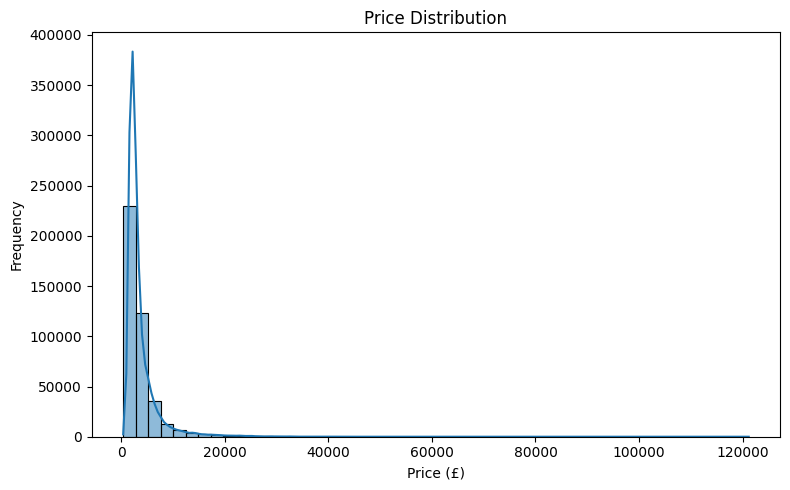

In [59]:
# Visualising price distribution
plt.figure(figsize=(8, 5))
sns.histplot(df_featureExplore['rentEstimate_currentPrice'], bins=50, kde=True)
plt.xlabel("Price (£)")
plt.ylabel("Frequency")
plt.title("Price Distribution")
plt.tight_layout()
plt.show()

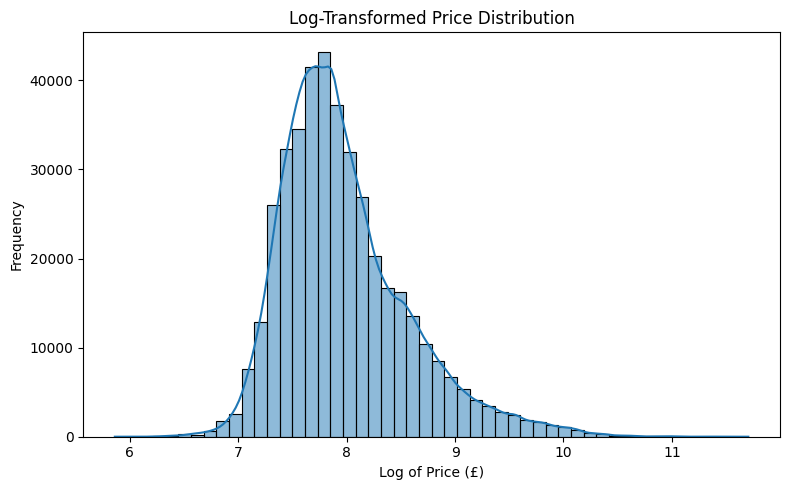

In [60]:
# Log transformation to reduce skewness
df_featureExplore['log_rentEstimate_currentPrice'] = df_featureExplore['rentEstimate_currentPrice'].apply(lambda x: np.log(x + 1))

# Visualising the log-transformed price distribution
plt.figure(figsize=(8, 5))
sns.histplot(df_featureExplore['log_rentEstimate_currentPrice'], bins=50, kde=True)
plt.xlabel("Log of Price (£)")
plt.ylabel("Frequency")
plt.title("Log-Transformed Price Distribution")
plt.tight_layout()
plt.show()

A log value of 7 corresponds to about £1,100.

A log value of 8 corresponds to about £3,000.

A log value of 9 corresponds to about £8,100.

A log value of 10 corresponds to about £22,000.

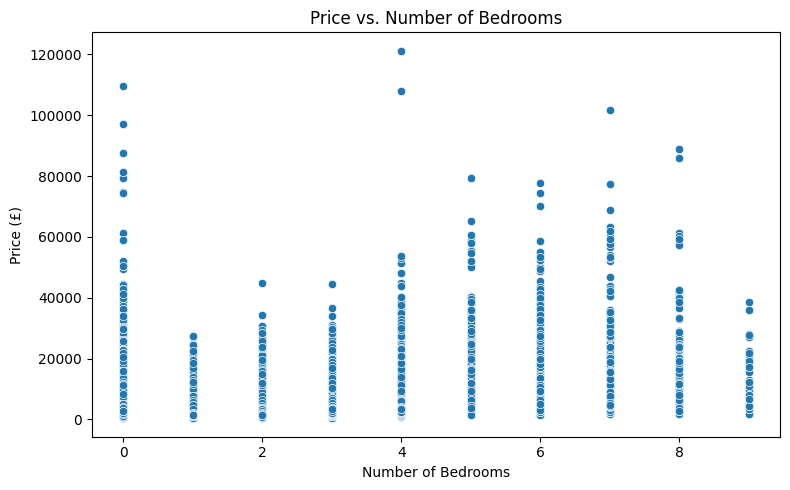

In [61]:
# Visualising the relationship between bedrooms and price
plt.figure(figsize=(8, 5))
sns.scatterplot(x=df_featureExplore['bedrooms'], y=df_featureExplore['rentEstimate_currentPrice'])
plt.xlabel("Number of Bedrooms")
plt.ylabel("Price (£)")
plt.title("Price vs. Number of Bedrooms")
plt.tight_layout()
plt.show()

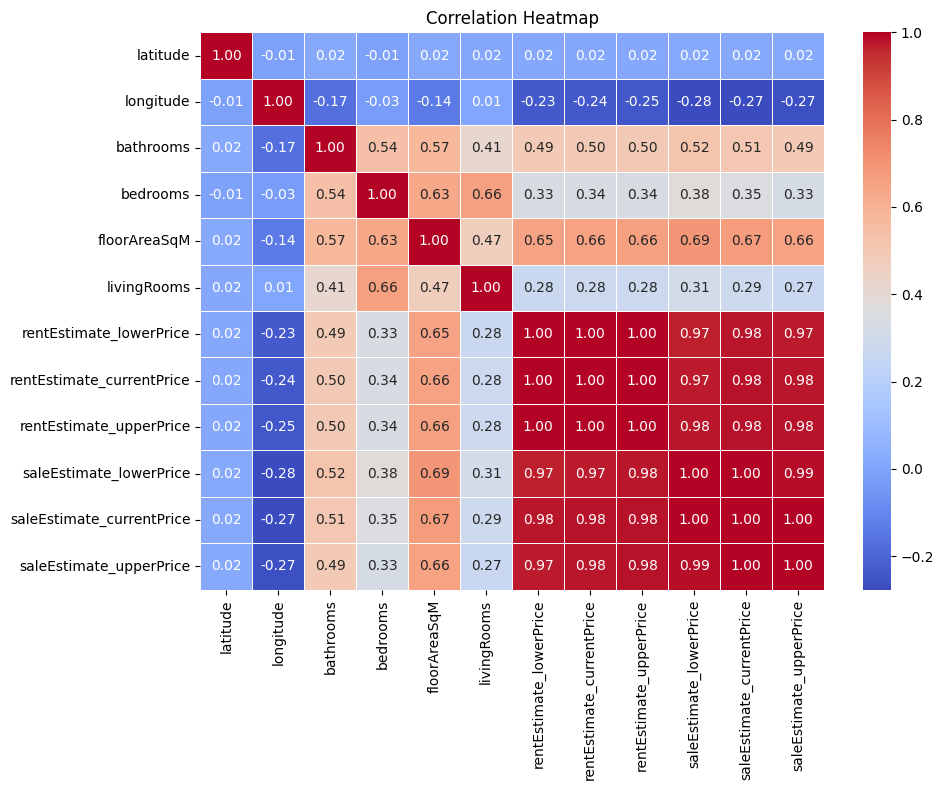

In [62]:
# Select only numeric columns for correlation
numeric_columns1 = df_clean3.select_dtypes(include=['float64', 'int64'])

# Correlation heatmap to explore relationships between numeric features
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns1.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

Dropping 'rentEstimate_lowerPrice', 'rentEstimate_upperPrice', 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice'

In [63]:
# Drop highly correlated rentEstimate columns
df_drop_matrix = df_clean3.drop(columns=['rentEstimate_lowerPrice', 'rentEstimate_upperPrice', 'saleEstimate_lowerPrice', 'saleEstimate_currentPrice', 'saleEstimate_upperPrice'])

# Confirm the columns after removal
print("Columns After Dropping Redundant rentEstimate Columns:\n", df_clean3.columns)


Columns After Dropping Redundant rentEstimate Columns:
 Index(['postcode', 'latitude', 'longitude', 'bathrooms', 'bedrooms',
       'floorAreaSqM', 'livingRooms', 'tenure', 'propertyType',
       'rentEstimate_lowerPrice', 'rentEstimate_currentPrice',
       'rentEstimate_upperPrice', 'saleEstimate_lowerPrice',
       'saleEstimate_currentPrice', 'saleEstimate_upperPrice'],
      dtype='object')


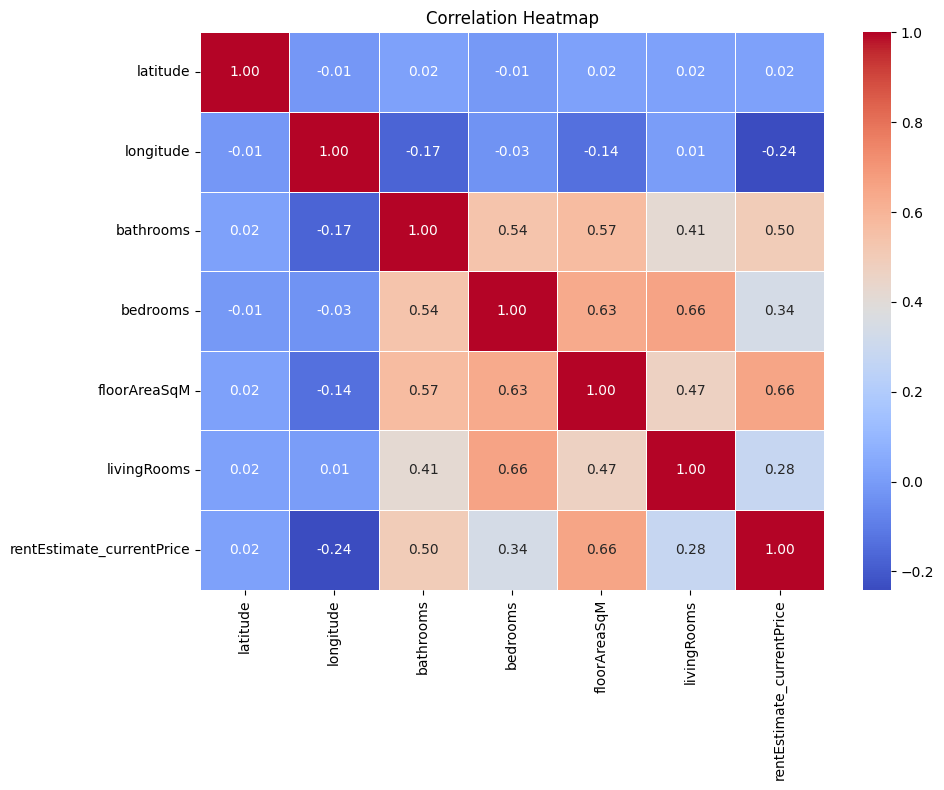

In [64]:
# Select only numeric columns for correlation
numeric_columns2 = df_drop_matrix.select_dtypes(include=['float64', 'int64'])

# Correlation heatmap to explore relationships between numeric features
plt.figure(figsize=(10, 8))
sns.heatmap(numeric_columns2.corr(), annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Heatmap")
plt.tight_layout()
plt.show()

In [65]:
# Create a base map centered around the average location
map_center = [df_featureExplore['latitude'].mean(), df_featureExplore['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=10)

# Create a list of locations and prices (lat, long, price)
locations = df_featureExplore[['latitude', 'longitude', 'rentEstimate_currentPrice']].dropna()

# Prepare the data in the form of (latitude, longitude, price) for the heatmap
heat_data = [[row['latitude'], row['longitude'], row['rentEstimate_currentPrice']] for index, row in locations.iterrows()]

# Add the heatmap to the map
HeatMap(heat_data).add_to(mymap)

# Display the map
mymap

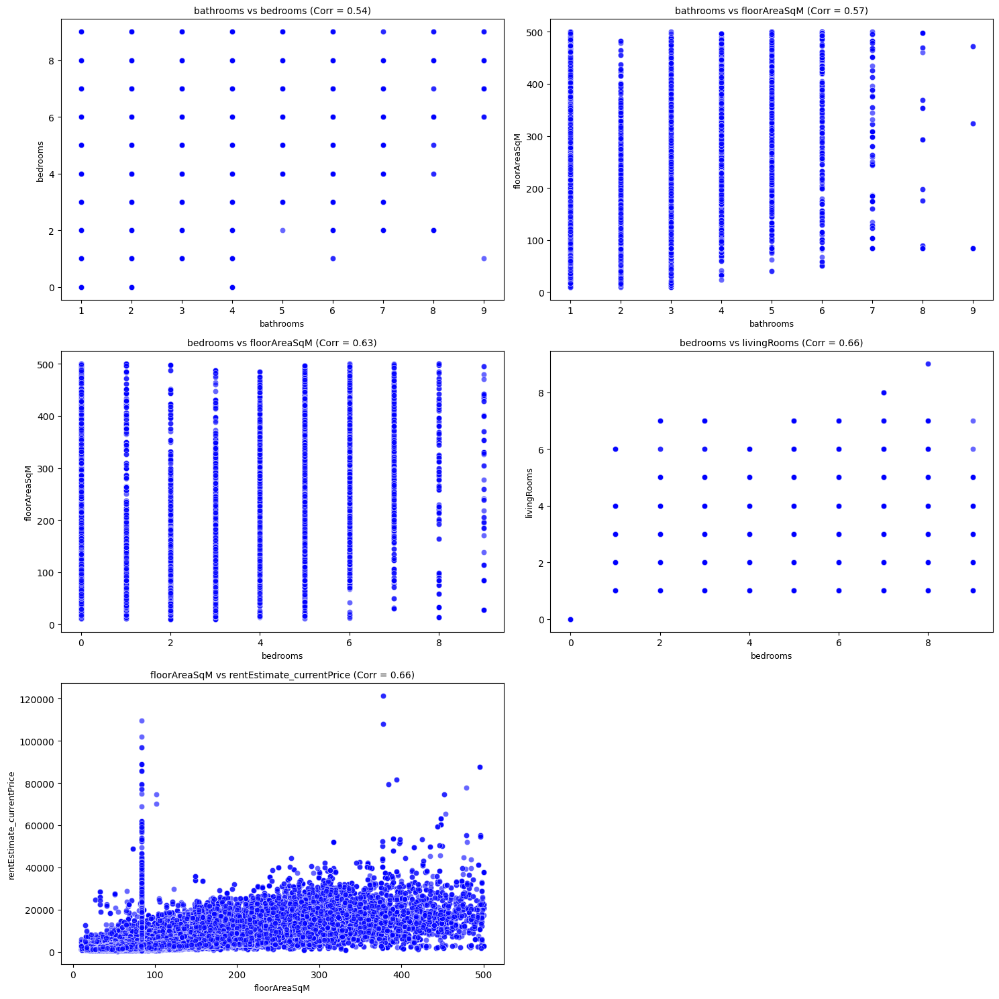

In [66]:
# Calculate the correlation matrix
corr_matrix = numeric_columns2.corr()

# Identify pairs of features with correlation > 0.5 or < -0.5
high_corr_pairs = []
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr = corr_matrix.iloc[i, j]
        if abs(corr) > 0.5:
            high_corr_pairs.append((corr_matrix.columns[i], corr_matrix.columns[j], corr))

# Subplot layout
n_pairs = len(high_corr_pairs)
n_cols = 2
n_rows = (n_pairs + n_cols - 1) // n_cols  # required rows

# figure with subplots
plt.figure(figsize=(15, 5 * n_rows))
for idx, (col1, col2, corr) in enumerate(high_corr_pairs, 1):
    plt.subplot(n_rows, n_cols, idx)
    sns.scatterplot(x=numeric_columns2[col1], y=numeric_columns2[col2], color='blue', alpha=0.6)
    plt.title(f'{col1} vs {col2} (Corr = {corr:.2f})', fontsize=10)
    plt.xlabel(col1, fontsize=9)
    plt.ylabel(col2, fontsize=9)

plt.tight_layout()
plt.show()

<ipython-input-67-eb5a32a7caef>:20: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


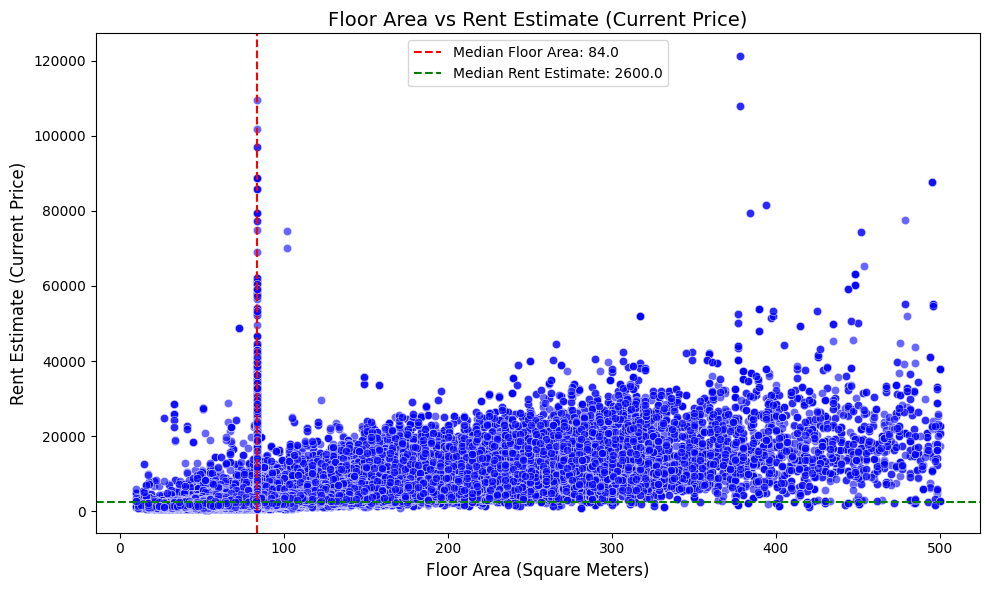

In [67]:
# Calculate the median values
median_floor_area = df_clean3['floorAreaSqM'].median()
median_rent = df_clean3['rentEstimate_currentPrice'].median()

# Scatter plot of floorAreaSqM vs rentEstimate_currentPrice
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_clean3['floorAreaSqM'], y=df_clean3['rentEstimate_currentPrice'], color='blue', alpha=0.6)

# Highlight the median with lines
plt.axvline(median_floor_area, color='red', linestyle='--', label=f'Median Floor Area: {median_floor_area}')
plt.axhline(median_rent, color='green', linestyle='--', label=f'Median Rent Estimate: {median_rent}')

# Add labels and title
plt.title('Floor Area vs Rent Estimate (Current Price)', fontsize=14)
plt.xlabel('Floor Area (Square Meters)', fontsize=12)
plt.ylabel('Rent Estimate (Current Price)', fontsize=12)
plt.legend()

# Display the plot
plt.tight_layout()
plt.show()